# Machine Learning Project - Credit Risk
### Decision Tree and Random Forest

**Dataset:**
German Banking Credit Profiles

**Objective:** to minimize loss from the bank’s perspective.

Bank (by loan manager) needs to decide who will get loan approval based on the applicants’ demographic and socio-economic profiles. The data set consists of 20 variables and classification on applicant whether he/she has good or bad credit risk. The predictive model will provide guidance in making loan approval decision on prospective applicants based on clients’ profiles.

**Methods:**

Perform the task using a Decision Tree and then the Random Forest algorithm.  Comapre Results.

## Import Libraries

In [113]:
# get all the import stuff taken care of

#general stuff
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# sklearn packages
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

# plotting
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

# Source: Week 4 Lecture

## Decision Tree

#### Load the dataset

In [114]:
df = pd.read_csv('assign_wk4/german_credit_risk.csv')
df.head()

,Checking.Account,Duration,Credit.Hist,Purpose,Credit.Amount,Saving.Account,Employmnet,Disposable.Income,Personal.Status,Other.Debtors,...,Property,Age,Other.Loans,Housing,Existing.Credits,Job,Number.Liable,Telephone,Foreign.Worker,Cost.Matrix
0,A11,6,A34,A43,1169,A65,A75,4,A93,A101,...,A121,67,A143,A152,2,A173,1,A192,A201,1
1,A12,48,A32,A43,5951,A61,A73,2,A92,A101,...,A121,22,A143,A152,1,A173,1,A191,A201,2
2,A14,12,A34,A46,2096,A61,A74,2,A93,A101,...,A121,49,A143,A152,1,A172,2,A191,A201,1
3,A11,42,A32,A42,7882,A61,A74,2,A93,A103,...,A122,45,A143,A153,1,A173,2,A191,A201,1
4,A11,24,A33,A40,4870,A61,A73,3,A93,A101,...,A124,53,A143,A153,2,A173,2,A191,A201,2


#### EDA

In [115]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Checking.Account   1000 non-null   object
 1   Duration           1000 non-null   int64 
 2   Credit.Hist        1000 non-null   object
 3   Purpose            1000 non-null   object
 4   Credit.Amount      1000 non-null   int64 
 5   Saving.Account     1000 non-null   object
 6   Employmnet         1000 non-null   object
 7   Disposable.Income  1000 non-null   int64 
 8   Personal.Status    1000 non-null   object
 9   Other.Debtors      1000 non-null   object
 10  Present.Residence  1000 non-null   int64 
 11  Property           1000 non-null   object
 12  Age                1000 non-null   int64 
 13  Other.Loans        1000 non-null   object
 14  Housing            1000 non-null   object
 15  Existing.Credits   1000 non-null   int64 
 16  Job                1000 non-null   object
 

There are 20 features and one target variable: 'Cost.Matrix'.  For the target, the value is either a 1 or a 2 where 1 = Good and 2 = Bad.  

There are no null values in the dataset, so I will not have to deal with imputing any data.  The dataset looks to be clean.

In [116]:
df.describe(include='all')

,Checking.Account,Duration,Credit.Hist,Purpose,Credit.Amount,Saving.Account,Employmnet,Disposable.Income,Personal.Status,Other.Debtors,...,Property,Age,Other.Loans,Housing,Existing.Credits,Job,Number.Liable,Telephone,Foreign.Worker,Cost.Matrix
count,1000,1000.000000,1000,1000,1000.000000,1000,1000,1000.000000,1000,1000,...,1000,1000.000000,1000,1000,1000.000000,1000,1000.000000,1000,1000,1000.000000
unique,4,NaN,5,10,NaN,5,5,NaN,4,3,...,4,NaN,3,3,NaN,4,NaN,2,2,NaN
top,A14,NaN,A32,A43,NaN,A61,A73,NaN,A93,A101,...,A123,NaN,A143,A152,NaN,A173,NaN,A191,A201,NaN
freq,394,NaN,530,280,NaN,603,339,NaN,548,907,...,332,NaN,814,713,NaN,630,NaN,596,963,NaN
mean,NaN,20.903000,NaN,NaN,3271.258000,NaN,NaN,2.973000,NaN,NaN,...,NaN,35.546000,NaN,NaN,1.407000,NaN,1.155000,NaN,NaN,1.300000
std,NaN,12.058814,NaN,NaN,2822.736876,NaN,NaN,1.118715,NaN,NaN,...,NaN,11.375469,NaN,NaN,0.577654,NaN,0.362086,NaN,NaN,0.458487
min,NaN,4.000000,NaN,NaN,250.000000,NaN,NaN,1.000000,NaN,NaN,...,NaN,19.000000,NaN,NaN,1.000000,NaN,1.000000,NaN,NaN,1.000000
25%,NaN,12.000000,NaN,NaN,1365.500000,NaN,NaN,2.000000,NaN,NaN,...,NaN,27.000000,NaN,NaN,1.000000,NaN,1.000000,NaN,NaN,1.000000
50%,NaN,18.000000,NaN,NaN,2319.500000,NaN,NaN,3.000000,NaN,NaN,...,NaN,33.000000,NaN,NaN,1.000000,NaN,1.000000,NaN,NaN,1.000000
75%,NaN,24.000000,NaN,NaN,3972.250000,NaN,NaN,4.000000,NaN,NaN,...,NaN,42.000000,NaN,NaN,2.000000,NaN,1.000000,NaN,NaN,2.000000


For the qualitative variables, each one has the amount of unique values corresponding with the documentation provided. Given this, I will not have to correct any entries to fit into the defined categories or impute any missing data. 

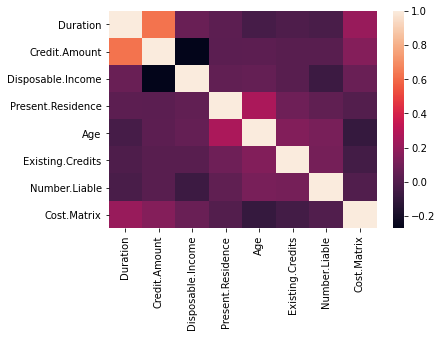

In [117]:
# Correlation Matrix
_ = sns.heatmap(df.corr())

There aren't many high correlations, positive or negative.  Credit.Amount is highly correlated with duration.  Disposable income is negatively correlated with Credit.Amount, but only slightly.  The target variable Cost.Matrix isn't highly correlated with any of the variables. Duration and Credit.Amount stand out as slightly higher correlated than the other features.

In [118]:
df['Cost.Matrix'].unique()

array([1, 2], dtype=int64)

The target variable has values 1 and 2 as expected.

### Encoding

Change the categorical variable strings to integers.  The model cannot work with strings.

Features to encode: 
- Checking.Account
- Credit.Hist
- Purpose
- Saving.Account
- Employmnet
- Personal.Status
- Other.Debtors
- Property
- Other.Loans
- Housing
- Job
- Telephone
- Foreign.Worker

In [119]:
df_encoded = df.copy()
df_encoded.head(5)

,Checking.Account,Duration,Credit.Hist,Purpose,Credit.Amount,Saving.Account,Employmnet,Disposable.Income,Personal.Status,Other.Debtors,...,Property,Age,Other.Loans,Housing,Existing.Credits,Job,Number.Liable,Telephone,Foreign.Worker,Cost.Matrix
0,A11,6,A34,A43,1169,A65,A75,4,A93,A101,...,A121,67,A143,A152,2,A173,1,A192,A201,1
1,A12,48,A32,A43,5951,A61,A73,2,A92,A101,...,A121,22,A143,A152,1,A173,1,A191,A201,2
2,A14,12,A34,A46,2096,A61,A74,2,A93,A101,...,A121,49,A143,A152,1,A172,2,A191,A201,1
3,A11,42,A32,A42,7882,A61,A74,2,A93,A103,...,A122,45,A143,A153,1,A173,2,A191,A201,1
4,A11,24,A33,A40,4870,A61,A73,3,A93,A101,...,A124,53,A143,A153,2,A173,2,A191,A201,2


In [121]:
# Replace regular columns with encoded columns
df_encoded['Checking.Account'] = df_encoded['Checking.Account'].astype('category').cat.codes
df_encoded['Credit.Hist'] = df_encoded['Credit.Hist'].astype('category').cat.codes
df_encoded['Purpose'] = df_encoded['Purpose'].astype('category').cat.codes
df_encoded['Saving.Account'] = df_encoded['Saving.Account'].astype('category').cat.codes
df_encoded['Employmnet'] = df_encoded['Employmnet'].astype('category').cat.codes
df_encoded['Personal.Status'] = df_encoded['Personal.Status'].astype('category').cat.codes
df_encoded['Other.Debtors'] = df_encoded['Other.Debtors'].astype('category').cat.codes
df_encoded['Property'] = df_encoded['Property'].astype('category').cat.codes
df_encoded['Other.Loans'] = df_encoded['Other.Loans'].astype('category').cat.codes
df_encoded['Housing'] = df_encoded['Housing'].astype('category').cat.codes
df_encoded['Job'] = df_encoded['Job'].astype('category').cat.codes
df_encoded['Telephone'] = df_encoded['Telephone'].astype('category').cat.codes
df_encoded['Foreign.Worker'] = df_encoded['Foreign.Worker'].astype('category').cat.codes

df_encoded.head()

# Source: https://pbpython.com/categorical-encoding.html

,Checking.Account,Duration,Credit.Hist,Purpose,Credit.Amount,Saving.Account,Employmnet,Disposable.Income,Personal.Status,Other.Debtors,...,Property,Age,Other.Loans,Housing,Existing.Credits,Job,Number.Liable,Telephone,Foreign.Worker,Cost.Matrix
0,0,6,4,4,1169,4,4,4,2,0,...,0,67,2,1,2,2,1,1,0,1
1,1,48,2,4,5951,0,2,2,1,0,...,0,22,2,1,1,2,1,0,0,2
2,3,12,4,7,2096,0,3,2,2,0,...,0,49,2,1,1,1,2,0,0,1
3,0,42,2,3,7882,0,3,2,2,2,...,1,45,2,2,1,2,2,0,0,1
4,0,24,3,0,4870,0,2,3,2,0,...,3,53,2,2,2,2,2,0,0,2


### Train-Test Split

In [122]:
#gather up names of all the columns
cols = df_encoded.columns

#set the prediction column and the feature columns for KNN
prediction_col = 'Cost.Matrix'
feature_cols = [c for c in cols if c != prediction_col]

x = df_encoded[feature_cols].values
y = df_encoded[prediction_col].values

#split the dataset into the train and test data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=41)

# Source: Week 4 Lecture

### Model Evaluation

In [128]:
# establish and fit the model using DecisonTree()
from sklearn import tree

tree_model = tree.DecisionTreeClassifier(random_state=0)
tree_model.fit(x_train, y_train)

#gathering the predictions
preds = tree_model.predict(x_test)

# Source: Week 4 Lecture

In [129]:
#display the actuals and predictions for the test set
print('Actuals for test data set')
print(y_test)
print('Predictions for test data set')
print(preds)

# Source: Week 4 Lecture

Actuals for test data set
[1 2 1 1 1 2 1 2 1 2 1 1 1 1 1 1 1 1 1 2 1 2 1 2 2 1 1 2 2 1 1 1 1 2 1 2 1
 1 1 1 2 1 1 2 1 2 1 1 2 1 2 1 1 2 2 2 1 1 1 2 1 1 1 2 1 1 1 2 1 2 2 1 2 1
 1 1 2 1 2 2 1 1 1 2 2 1 2 1 1 1 1 1 1 2 1 1 1 1 2 1 2 1 1 1 2 1 1 1 1 2 1
 1 1 1 1 1 2 2 1 1 2 1 1 2 2 1 1 2 1 1 2 2 1 1 1 1 1 1 1 1 2 2 2 1 2 1 2 1
 2 2 1 2 1 2 1 1 1 2 2 2 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 2 2 1 1 1 1 2 1 1 2
 1 1 2 1 2 2 1 1 1 1 2 2 1 2 1]
Predictions for test data set
[1 2 1 1 1 2 1 2 1 1 1 2 1 1 2 2 2 1 1 1 1 2 1 2 1 2 1 2 2 1 2 2 1 2 1 2 2
 1 2 2 1 2 1 2 1 2 2 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 2 1 2 1 1 1 1 2 1 1 1
 1 1 1 1 2 1 1 1 2 2 1 2 2 1 2 1 1 2 1 1 1 1 1 1 2 1 2 2 2 1 1 2 1 1 2 2 1
 1 1 1 2 1 1 1 1 2 2 2 1 1 1 1 1 2 1 1 1 1 1 1 2 1 1 1 2 1 1 2 1 2 2 1 1 1
 1 1 1 1 1 2 1 2 1 1 2 2 1 1 2 1 2 1 1 2 1 1 1 1 1 2 1 2 1 1 2 1 1 1 1 2 1
 1 1 1 2 2 1 2 2 1 1 2 2 1 1 2]


1    131
2     69
dtype: int64


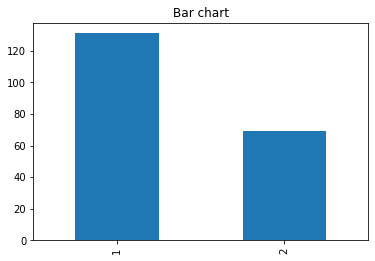

In [132]:
# Test Values
test_by_quality=pd.value_counts(y_test, sort= True)
test_by_quality.plot(kind= 'bar')
plt.title('Bar chart')

print(test_by_quality)

# Source: Week 4 Lecture

1    129
2     71
dtype: int64


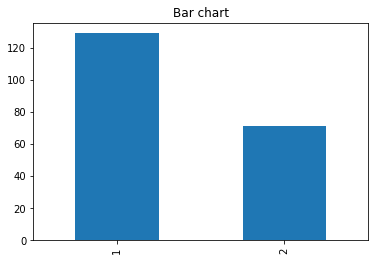

In [133]:
# Predicted Values
preds_by_quality=pd.value_counts(preds, sort= True)
preds_by_quality.plot(kind= 'bar')
plt.title('Bar chart')

print(preds_by_quality)

# Source: Week 4 Lecture

The graphs above show that the model predictions look pretty close to the actual values, in terms of overall 1s and 2s predicted.  Only 2 extra 2s and 2 few 1s were predicted by the model compared to the test data.

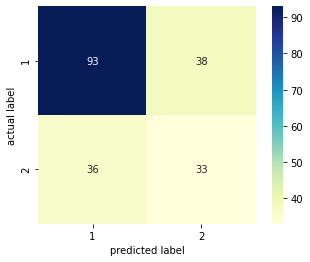

In [134]:
# make a confusion matrix to display the results
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, preds)
target_labels = np.unique(y_test)

sns.heatmap(cm, square=True, annot=True, fmt='d', cbar=True, cmap="YlGnBu",
            xticklabels=target_labels, yticklabels=target_labels)

plt.xlabel('predicted label')
plt.ylabel('actual label');

# Source: Week 4 Lecture

Confusion Matrix Interpretation:

93 Good were classified as Good.  36 Good were classified as Bad.  These are False negatives.  
33 Bad were classified as bad.  38 Bads were classified as Good.  These are False positives.

In this case, it is worse to class a customer as good when they are bad (36), than it is to class a customer as bad when they are good (38).  In terms of risk, it is worse for a person with bad credit to be approved accidentally than for a person with good credit to be denied accidentally.  It is worse for the bank if the bad person defaults compared to not making loan interest from the good person, who probably pays on time anyway, so interest might not be that much.


#### Accuracy Score

In [136]:
#using the sklearn.metrics package to determine the accuracy of the model
from sklearn.metrics import accuracy_score

print(accuracy_score(y_test,preds))

# Source: Week 4 Lecture

0.63


The model gets it the classification right 63% of the time.  This is better than random guessing (50%) but still not great.  I will see if pruning helps.

#### Display the Importance Features

In [137]:
# display the importance features

importance_list = list(zip(feature_cols,tree_model.feature_importances_))
sorted_import_feature = sorted(importance_list, key = lambda x: x[1],reverse=True)
sorted_import_feature

# Source: Week 4 Lecture

[('Credit.Amount', 0.188211524696307),
 ('Checking.Account', 0.13651637607754727),
 ('Duration', 0.11012865673096252),
 ('Age', 0.09085016538422894),
 ('Credit.Hist', 0.05055819961624825),
 ('Saving.Account', 0.047989995147879244),
 ('Employmnet', 0.04728884410929327),
 ('Purpose', 0.045739583765011735),
 ('Disposable.Income', 0.04374227422181226),
 ('Other.Loans', 0.03951681372266651),
 ('Property', 0.03577444651277543),
 ('Other.Debtors', 0.0333576825399819),
 ('Personal.Status', 0.03190846018118092),
 ('Present.Residence', 0.020475803242215672),
 ('Housing', 0.01683782479436736),
 ('Number.Liable', 0.016804530822148896),
 ('Existing.Credits', 0.014984865126267963),
 ('Job', 0.01278457806939147),
 ('Telephone', 0.01174083387125179),
 ('Foreign.Worker', 0.004788541368461575)]

For the complete tree, Credit.Amount is the most important feature, with Checking.Account, Duration, and Age behind.  These features help the most in classifying, and therefore are probably used first in splitting.  

#### Plotting and Interpretting the Tree

Note: I had trouble getting the tree to plot.  The below source/forum helped me solve the issue.

Source: https://datascience.stackexchange.com/questions/37428/graphviz-not-working-when-imported-inside-pydotplus-graphvizs-executables-not

A method that worked for me was inserting these lines in my code (before the graphviz related functions):

```python
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"
```


In [138]:
# Visualize data 

import pydotplus
#from sklearn import tree (already imported)
import collections


import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"


dot_data = tree.export_graphviz(tree_model,
                                feature_names=feature_cols,
                                out_file=None,
                                filled=True,
                                rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)

colors = ('turquoise', 'orange')
edges = collections.defaultdict(list)

for edge in graph.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])

graph.write_png('assign_wk4/decisiontree.png')

# Source: Week 4 Lecture

True

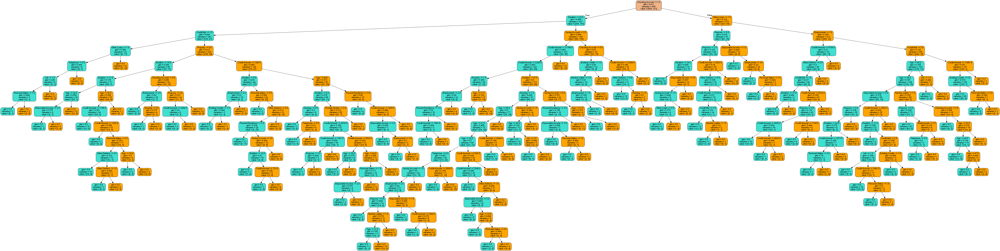

In [31]:
#display the png here
from IPython.display import Image

Image(filename='assign_wk4/decisiontree.png') 

# Source: Week 4 Lecture

###### Interpretation

The complete decision tree is pretty extensive.  The root is 'Checking.Account <=1.5' which, as encoded, seems to check if the person has a checking account or not.  The branches off the root are "Duration <= 22.5" and "Other.Loans <= 1.5".  Duration checks whether the checking account has been open for more than 22.5 months or not.  Other.Loans checks whether the person has other loans.  From this branch, the trees get more detailed.  The tree splits on impurity measured by the gini method.  It splits until impurity is 0, which means that there is no impurity and all data at that juncture belongs to one class.  These are the leaf nodes. 

### Pruning

A fully formed tree is susceptible to overfitting.  This can be mitigated by pruning some of theleaf nodes.

Cost complexity pruning provides one option to control the size of a tree. In DecisionTreeClassifier, this pruning technique is parameterized by the cost complexity parameter, ccp_alpha. Greater values of ccp_alpha increase the number of nodes pruned. 


Source: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html

In [139]:
#Initialize the model and set complexity parameter ccp_alphas and impurity measures.
clf = tree.DecisionTreeClassifier(random_state=0)
path = clf.cost_complexity_pruning_path(x_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Minimal cost complexity pruning recursively finds the node with the “weakest link”, or those with smallest effective alpha.  The weakest link is pruned first.   

To show what values of ccp_alpha might be best, I use the DecisionTreeClassifier.cost_complexity_pruning_path() method.  When plotted (below) this shows the alpha with corresponding leaf impurities at each step ofthe pruning process.  

The trend in the graph shows that as alpha increases, more of the tree is pruned, which increases the total impurity of its leaves.

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

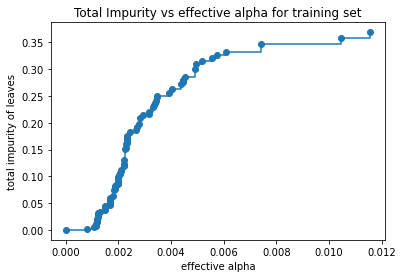

In [140]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

Next, train a decision tree model using the effective alphas. 

The last value in ccp_alphas is the alpha value that prunes the whole tree, leaving the tree, clfs[-1], with one node.

In [141]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = tree.DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(x_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.04181204066104316


I remove the last element in clfs and ccp_alphas, because it is the trivial tree with only one node.

THe graphs below show that the number of nodes and tree depth decreases as alpha increases.

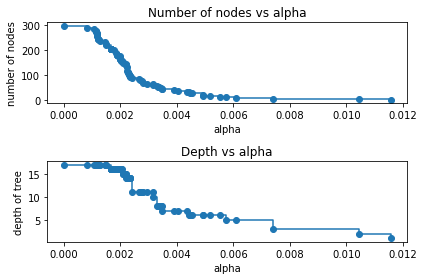

In [142]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

When ccp_alpha is set to zero, the tree overfits, leading to a 100% training accuracy and 63% testing accuracy that I showed above. 

As alpha increases, more of the tree is pruned, thus creating a decision tree that generalizes better. In this example, setting ccp_alpha=0.0075 maximizes the testing accuracy at around 75%.

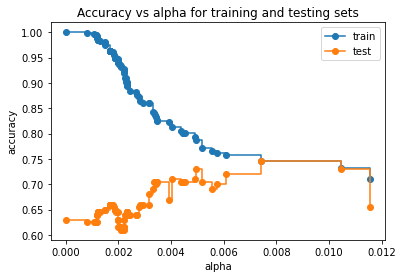

In [143]:
train_scores = [clf.score(x_train, y_train) for clf in clfs]
test_scores = [clf.score(x_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

Below, I get the best pruned model and evaluate it

In [152]:
# Find the highest score recorded
max_score = 0
for score in test_scores:
    if score > max_score:
        max_score = score

In [154]:
# Save the model that got the highest score
for x in range(len(test_scores)):
    if test_scores[x] == max_score:
        position = x
        
pruned_tree_model = clfs[position]

In [155]:
#gathering the predictions from the best model
preds = pruned_tree_model.predict(x_test)

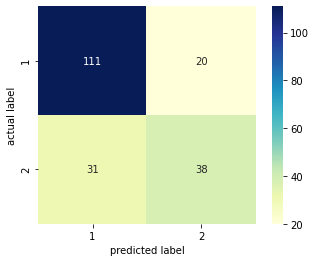

In [156]:
# make a confusion matrix to display the results
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, preds)
target_labels = np.unique(y_test)

sns.heatmap(cm, square=True, annot=True, fmt='d', cbar=True, cmap="YlGnBu",
            xticklabels=target_labels, yticklabels=target_labels)

plt.xlabel('predicted label')
plt.ylabel('actual label');

# Source: Week 4 Lecture

The pruned tree classifies 111 1s correctly while classifying 38 2s correctly.  It has 20 false negatives and 31 false positives.

In [157]:
#using the sklearn.metrics package to determine the accuracy of the model
from sklearn.metrics import accuracy_score

print(accuracy_score(y_test,preds))

0.745


The pruned Decision Tree gets a score of 74.5% accuracy.  This is much improved from the 63% of the non-pruned tree.

In [158]:
# display the importance features

importance_list = list(zip(feature_cols,pruned_tree_model.feature_importances_))
sorted_import_feature = sorted(importance_list, key = lambda x: x[1],reverse=True)
sorted_import_feature

# Source: Week 4 Lecture

[('Checking.Account', 0.6550431615047422),
 ('Duration', 0.18111007326361997),
 ('Credit.Hist', 0.16384676523163788),
 ('Purpose', 0.0),
 ('Credit.Amount', 0.0),
 ('Saving.Account', 0.0),
 ('Employmnet', 0.0),
 ('Disposable.Income', 0.0),
 ('Personal.Status', 0.0),
 ('Other.Debtors', 0.0),
 ('Present.Residence', 0.0),
 ('Property', 0.0),
 ('Age', 0.0),
 ('Other.Loans', 0.0),
 ('Housing', 0.0),
 ('Existing.Credits', 0.0),
 ('Job', 0.0),
 ('Number.Liable', 0.0),
 ('Telephone', 0.0),
 ('Foreign.Worker', 0.0)]

For the pruned tree, the only features that matter are 'Checking.Account' (which is by far the most important, 'Duration', and 'Credit.Hist'.  These aren't many of the original features.

In [159]:
# Visualize data 

import pydotplus
#from sklearn import tree (already imported)
import collections


import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"


dot_data = tree.export_graphviz(pruned_tree_model,
                                feature_names=feature_cols,
                                out_file=None,
                                filled=True,
                                rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)

colors = ('turquoise', 'orange')
edges = collections.defaultdict(list)

for edge in graph.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])

graph.write_png('assign_wk4/pruneddecisiontree.png')

# Source: Week 4 Lecture

True

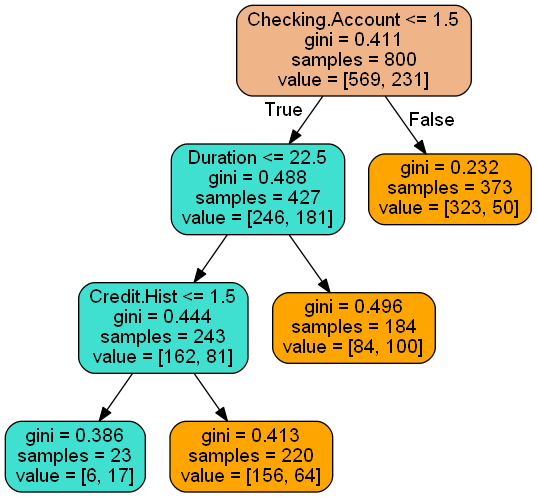

In [160]:
#display the png here
from IPython.display import Image

Image(filename='assign_wk4/pruneddecisiontree.png') 

# Source: Week 4 Lecture

The visualization above shows that the pruned tree got pruned a lot.  The result is a simple tree with four levels.  This tree had the highest accuracy of the pruned options, but I wonder if it might be too simple and would be concerned with how it would handle new data.  However, the problem of credit risk might really come down to only a few factors.  It is possible that the remaining features of the original 20 just introduce noise into the model.

Overall, the pruned tree performed much better than the un-pruned tree, and it seems to zero in on a few key features.  The accuracy still isn't that high and the tree seems very simple, so I would proceed with caution if I was to use it in this kind of decision making.

# Random Forest

Now I run the same problem with the Random Forest Algorithm and see how it compares.

In [161]:
# Create the model
from sklearn.ensemble import RandomForestClassifier

forest_model = RandomForestClassifier(n_jobs = -1, random_state=41)
forest_model.fit(x_train,y_train)

#gathering the predictions
forest_preds = forest_model.predict(x_test)

#### Model Evaluation

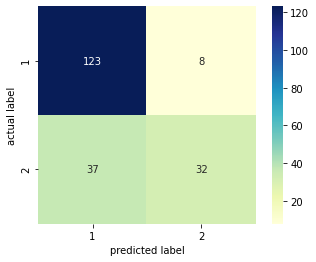

In [162]:
# make a confusion matrix to display the results
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, forest_preds)
target_labels = np.unique(y_test)

sns.heatmap(cm, square=True, annot=True, fmt='d', cbar=True, cmap="YlGnBu",
            xticklabels=target_labels, yticklabels=target_labels)

plt.xlabel('predicted label')
plt.ylabel('actual label');

# Source: Week 4 Lecture

The random forest model classifies 123 1s correctly and 32 2s correctly.  There are 8 false negatives and 37 false positives.  The high ratio of false positives compared with false negatives would signal extra risk to the bank manager.

The Random Forest model performs better than the pruned Decision Tree, however.  It's accuracy of 77.5% is greater than even the pruned tree at 74.5% accuracy.  As we learned in the readings this week, the Random Forest is the more powerful algorithm.

In [163]:
#using the sklearn.metrics package to determine the accuracy of the model
print(accuracy_score(y_test,forest_preds))

# Source: Week 4 Lecture

0.775


In [164]:
# display the importance features with our tree

importance_list = list(zip(feature_cols,forest_model.feature_importances_))
sorted_import_feature = sorted(importance_list, key = lambda x: x[1],reverse=True)
sorted_import_feature

# Source: Week 4 Lecture

[('Credit.Amount', 0.1378503815261767),
 ('Checking.Account', 0.1072107059522599),
 ('Age', 0.10046902286046178),
 ('Duration', 0.09483113749486784),
 ('Purpose', 0.06874097399371305),
 ('Credit.Hist', 0.05729604644110577),
 ('Employmnet', 0.05310094914501168),
 ('Saving.Account', 0.04532034984064704),
 ('Property', 0.044298043940598136),
 ('Present.Residence', 0.042917944325543855),
 ('Disposable.Income', 0.040770328824556605),
 ('Personal.Status', 0.037634258916000876),
 ('Job', 0.030808787134146604),
 ('Other.Loans', 0.02988712552095591),
 ('Housing', 0.02426600753679115),
 ('Telephone', 0.022757778861227863),
 ('Other.Debtors', 0.02069162357729025),
 ('Existing.Credits', 0.02066861717387948),
 ('Number.Liable', 0.015814920371244233),
 ('Foreign.Worker', 0.004664996563521271)]

The important features of the Random Forest model are very similar to those of the un-pruned Decision Tree.

#### Display one of the trees in the forest.

In [165]:
col_names = df_encoded.columns
col_names

Index(['Checking.Account', 'Duration', 'Credit.Hist', 'Purpose',
       'Credit.Amount', 'Saving.Account', 'Employmnet', 'Disposable.Income',
       'Personal.Status', 'Other.Debtors', 'Present.Residence', 'Property',
       'Age', 'Other.Loans', 'Housing', 'Existing.Credits', 'Job',
       'Number.Liable', 'Telephone', 'Foreign.Worker', 'Cost.Matrix'],
      dtype='object')

In [166]:
from sklearn.tree import export_graphviz

estimator= forest_model.estimators_[50] #extract one tree to test
features = col_names[:-1]

In [167]:
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = features,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [168]:
# Convert to png using system command
from subprocess import call
call (['dot', '-Tpng', 'tree.dot', '-o', 'assign_wk4/tree.png', '-Gdpi=600'])

0

In [169]:
# Display in notebook
from IPython.display import Image
Image(filename='assign_wk4/tree.png')

This Random Forest Tree is fairly complex.  It has a lot of branches and levels.  The first thing it checks is 'Duration <= 16.5' and then goes on to check employment status and credit amount.  It is important to keep in mind that this is one tree out of a forest of trees, and that features are split randomly to avoid highly correlated trees.

### Optimization

Next, I attempt at optimizing the Random Forest Classifier.

source: https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

First, I look at what parameters RandomForestClassifier() uses.  These are what I will be optimizing.

In [170]:
#from sklearn.ensemble import RandomForestRegressor

optimize_forest_model = RandomForestClassifier(n_jobs = -1, random_state = 42)
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(optimize_forest_model.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


Next, I run a randomized search of several different combinations of parameters.  

In [171]:
from sklearn.model_selection import RandomizedSearchCV

# Method of selecting samples for training each tree
bootstrap = [True, False]
#The function to measure the quality of a split
criterion = ['gini','entropy']
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 'log2']
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]


# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'criterion': criterion}
pprint(random_grid)

{'bootstrap': [True, False],
 'criterion': ['gini', 'entropy'],
 'max_features': ['auto', 'sqrt', 'log2'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [172]:
# Use the random grid to search for best hyperparameters

# First create the base model to tune
optimize_forest_model = RandomForestClassifier(n_jobs = -1, random_state = 42)

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = optimize_forest_model, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(x_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   27.7s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.1min finished


RandomizedSearchCV(cv=3,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

The cell below shows the best parameters tested.

In [173]:
rf_random.best_params_

{'n_estimators': 400,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'criterion': 'gini',
 'bootstrap': True}

I use the best parameters from the RandomizedSearchCV and find what that model scores.  The models scores 78.5% which is a slight improvemnt from the baseline Random Forest score of 77.5%

In [174]:
best_random = rf_random.best_estimator_
#gathering the predictions
preds = best_random.predict(x_test)
print(accuracy_score(y_test,preds))

0.785


Now, I try GridSearchCV to see if I can improve the model again.  The step above showed in general which parameters are best, so I will keep them, and try some ones similar to them.

In [175]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'criterion':['gini'],
    'max_features': ['auto'],
    'min_samples_leaf': [2, 3],
    'min_samples_split': [2,3],
    'n_estimators': [200, 300, 400, 1000]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [176]:
# Fit the grid search to the data
grid_search.fit(x_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed:   16.9s finished


{'bootstrap': True,
 'criterion': 'gini',
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 3,
 'n_estimators': 300}

In [177]:
best_grid = grid_search.best_estimator_
preds = best_grid.predict(x_test)
print(accuracy_score(y_test,preds))

0.785


Using the best parameters from the GridSearchCV optimization, I once again score 78.5%, which is not a bad performance.  It is the highest out of the Decision Tree, the Pruned Decision Tree, and the Non-Optimized Random Forest.

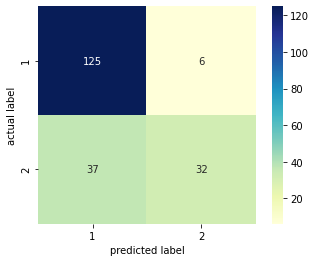

In [178]:
# make a confusion matrix to display the results
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, preds)
target_labels = np.unique(y_test)

sns.heatmap(cm, square=True, annot=True, fmt='d', cbar=True, cmap="YlGnBu",
            xticklabels=target_labels, yticklabels=target_labels)

plt.xlabel('predicted label')
plt.ylabel('actual label');

The optimized random forest model classified 125 1s correctly and 32 2s correctly.  It had 6 false negatives but 37 false positives.  

## Comparison of Results

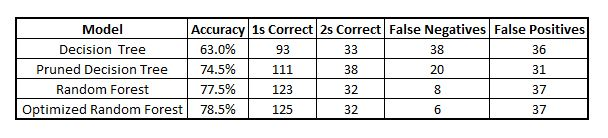

In [179]:
# Display in notebook
from IPython.display import Image
Image(filename='assign_wk4/Capture.jpg')

The above chart showed that the optimized random forest model had the highest accuracy and lowest false negatives.  This is probably the model the manager would choose out of the four options.  However, the manager might also consider the Pruned Decision Tree because of it's lowest value of False Positives. This could be a choice that would mitigate the most risk, but would come at rejecting more Good applicants than either of the random forest models.  This would be a risk tradeoff that the manager would have to analyze further and then make a decision that they deem the most aligned with the bank's goals.